<center><h1>Zhao_Zihan_Project</h1></center>

Name: Zihan Zhao
<br>
Github Username: Jack020945
<br>
USC ID: 1577326810

Import packages

In [1]:
import scipy

import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
import sys
from sklearn.metrics import  auc
from itertools import cycle
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import label_binarize
import os
from sklearn.utils import resample
from pandas.errors import EmptyDataError
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFECV
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm
from sklearn import datasets
from sklearn.feature_selection import RFE
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.metrics import hamming_loss
from collections import Counter
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegressionCV
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV

from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score, KFold
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
import math
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as IMBPipeline
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering

### pre-process data 1(a) (b) i, ii, iii

In [25]:

import re
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer


# Paths to the data folders
neg_folder = '../data/neg'
pos_folder = '../data/pos'

def preprocess_text(text):
    
    # Remove punctuation and numbers
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    text = re.sub(r'\d+', '', text)      # Remove numbers
    return text

def load_data(folder_path, sentiment, train_range=(0, 699), test_range=(700, 999)):
   
    train_texts, train_labels = [], []
    test_texts, test_labels = [], []
    for filename in os.listdir(folder_path):
        match = re.match(r'cv(\d+)', filename)
        if match:
            index = int(match.group(1))
            file_path = os.path.join(folder_path, filename)
            with open(file_path, 'r', encoding='utf-8') as file:
                text = file.read()
                text = preprocess_text(text)
                if train_range[0] <= index <= train_range[1]:
                    train_texts.append(text)
                    train_labels.append(sentiment)
                elif test_range[0] <= index <= test_range[1]:
                    test_texts.append(text)
                    test_labels.append(sentiment)
    return train_texts, train_labels, test_texts, test_labels



# Load and preprocess data
pos_train_texts, pos_train_labels, pos_test_texts, pos_test_labels = load_data(pos_folder, 1)
neg_train_texts, neg_train_labels, neg_test_texts, neg_test_labels = load_data(neg_folder, -1)

# Combine training and testing datasets
train_texts = pos_train_texts + neg_train_texts
train_labels = np.array(pos_train_labels + neg_train_labels)
test_texts = pos_test_texts + neg_test_texts
test_labels = np.array(pos_test_labels + neg_test_labels)

# Example feature extraction using TF-IDF
vectorizer = TfidfVectorizer()
train_features = vectorizer.fit_transform(train_texts)
test_features = vectorizer.transform(test_texts)

print("Data loaded and preprocessed.")
print("Training samples:", len(train_labels))
print("Testing samples:", len(test_labels))



Data loaded and preprocessed.
Training samples: 1400
Testing samples: 600


### pre-process data 1 (b) iv

In [32]:

all_texts = train_texts + test_texts


vectorizer = CountVectorizer()


vectorizer.fit(all_texts)


unique_words = vectorizer.get_feature_names_out()

print("Total unique words in the dataset:", len(unique_words))



Total unique words in the dataset: 47010


### pre-process data 1 (b) v

In [5]:
def calculate_review_lengths(texts):
    """
    Calculate the lengths of reviews in words and return them as a list.
    """
    lengths = [len(text.split()) for text in texts]
    return lengths


review_lengths = calculate_review_lengths(all_texts)


average_length = np.mean(review_lengths)

std_dev_length = np.std(review_lengths)

print("Average review length:", average_length)
print("Standard deviation of review lengths:", std_dev_length)

Average review length: 644.3575
Standard deviation of review lengths: 284.98012333099655


### pre-process data 1 (b) vi

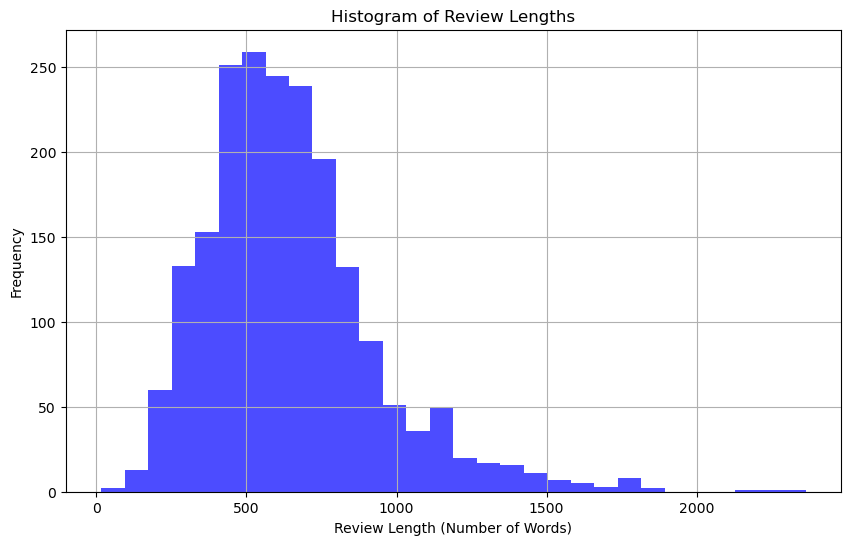

In [6]:


# Plotting the histogram of review lengths
plt.figure(figsize=(10, 6))
plt.hist(review_lengths, bins=30, color='blue', alpha=0.7)
plt.title('Histogram of Review Lengths')
plt.xlabel('Review Length (Number of Words)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()
    

  




### pre-process data 1 (b) vii


In [22]:
from collections import Counter


def tokenize_by_rank(texts):
    
    tokenized_texts = []
    for text in texts:
       
        word_counts = Counter(text.split())
   
        sorted_words = sorted(word_counts.items(), key=lambda item: item[1], reverse=True)
  
        word_ranks = {word: rank for rank, (word, _) in enumerate(sorted_words, start=1)}
       
        ranked_text = [word_ranks[word] for word in text.split()]
        tokenized_texts.append(ranked_text)
    return tokenized_texts



tokenized_texts = tokenize_by_rank(all_texts)

# Display the results
print("Tokenized texts by word rank frequency:")
for original, tokenized in zip(all_texts, tokenized_texts):
    print(f"Original: {original}\nTokenized: {tokenized}\n")





Tokenized texts by word rank frequency:
Original: plot  derek zoolander is a male model  
he is also very dumb and impressionable  
for that reason  he is secretly hired and trained  so secret  that even he doesnt know about it  by an underground fashion syndicate to assassinate the prime minister of malaysia  who wants to abolish child labor in his country  
will zoolander fulfill the dirty deed  
will zoolander ever grace the world his new  look   
is this a funny movie  
find out below    
critique  theres a place in our world for  stupid comedies   
films which dont pretend to take themselves seriously  are based on idiotic premises and filled with dumb jokes  
theres also a time for them and many would argue that this difficult period of our history  might be an ideal circumstance during which to  relax  by watching something so completely frivolous  
well  if youre in the mood for some seriously mindless entertainment  ben stiller and his cast of many have assembled one of the mo

### pre-process data 1 (b) viii

In [23]:
review_lengths = [len(text.split()) for text in all_texts]  


L_70 = np.percentile(review_lengths, 70)  # 70th percentile
L_90 = np.percentile(review_lengths, 90)  # 90th percentile

print(f"70% of the reviews have a length below: {int(L_70)}")
print(f"90% of the reviews have a length below: {int(L_90)}")



70% of the reviews have a length below: 737
90% of the reviews have a length below: 993


##### pre-process data 1 (b) ix

In [24]:
def truncate_and_pad(texts, max_length):
    
    adjusted_texts = []
    for text in texts:
        words = text.split()
        if len(words) > max_length:
    
            words = words[:max_length]
        elif len(words) < max_length:
            
            words.extend([0] * (max_length - len(words)))  
        adjusted_texts.append(words)
    return adjusted_texts


L = int(L_70) 
adjusted_reviews = truncate_and_pad(all_texts, L)


adjusted_reviews = [' '.join(map(str, review)) for review in adjusted_reviews]




##### (c) Word Embeddings i, ii

In [33]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Flatten, Dense
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer


pos_train_texts, pos_train_labels, pos_test_texts, pos_test_labels = load_data(pos_folder, 1)
neg_train_texts, neg_train_labels, neg_test_texts, neg_test_labels = load_data(neg_folder, -1)


train_texts = pos_train_texts + neg_train_texts
test_texts = pos_test_texts + neg_test_texts
y_train = np.array(pos_train_labels + neg_train_labels)
y_test = np.array(pos_test_labels + neg_test_labels)

# Tokenization and padding
vocab_size = 5000
max_length = L
tokenizer = Tokenizer(num_words=vocab_size)
tokenizer.fit_on_texts(train_texts + test_texts)
train_sequences = tokenizer.texts_to_sequences(train_texts)
test_sequences = tokenizer.texts_to_sequences(test_texts)
X_train = pad_sequences(train_sequences, maxlen=max_length, padding='post', truncating='post')
X_test = pad_sequences(test_sequences, maxlen=max_length, padding='post', truncating='post')

# Define the neural network model
model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=32, input_length=max_length),
    Flatten(),
    Dense(50, activation='relu'),
    Dense(50, activation='relu'),
    Dense(50, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compile and train the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=2, batch_size=10, validation_data=(X_test, y_test))

# Display the model's architecture
model.summary()

Epoch 1/2


/Users/JackZ/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.0585 - loss: -3.3097 - val_accuracy: 0.0083 - val_loss: -99.1732
Epoch 2/2
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.0284 - loss: -180.5613 - val_accuracy: 0.0350 - val_loss: -1853.1929


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_3 (Embedding)         │ (10, 737, 32)          │       160,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (10, 23584)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (10, 50)               │     1,179,250 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (10, 50)               │         2,550 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (10, 50)               │         2,550 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (10, 1)                │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,033,205 (15.39 MB)

 Trainable params: 1,344,401 (5.13 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,688,804 (10.26 MB)

##### (d) Multi-Layer Perceptron

In [38]:

import tensorflow as tf
from tensorflow.keras.layers import  Dropout

# Converts [-1,1] to [0,1], 
#using [0,1] is more suitable for binary cassification can increase the accuracy
y_train = (y_train + 1) // 2  
y_test = (y_test + 1) // 2

model = Sequential([
    Dense(50, activation='relu', input_shape=(X_train.shape[1],)),  
    Dropout(0.2),  # 20% Dropout rate 
    Dense(50, activation='relu'),
    Dropout(0.5),  # 50% Dropout rate 
    Dense(50, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')  
])


model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train 
history = model.fit(X_train, y_train, epochs=2, batch_size=10, validation_data=(X_test, y_test))

train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)


test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)


print(f"Train Accuracy: {train_accuracy*100:.2f}%")
print(f"Test Accuracy: {test_accuracy*100:.2f}%")








Epoch 1/2


/Users/JackZ/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 784us/step - accuracy: 0.5125 - loss: 246.1131 - val_accuracy: 0.5033 - val_loss: 23.7167
Epoch 2/2
140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 480us/step - accuracy: 0.5044 - loss: 67.2796 - val_accuracy: 0.4583 - val_loss: 6.8123
Train Accuracy: 54.57%
Test Accuracy: 45.83%


#### (e) One-Dimensional Convolutional Neural Network:

In [39]:

from tensorflow.keras.layers import Conv1D, MaxPooling1D

# Parameters
vocab_size = 5000  
embedding_dim = 32 
max_length = L  

model = Sequential()
model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_length))
model.add(Conv1D(filters=32, kernel_size=3, activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(50, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))


model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


history = model.fit(X_train, y_train, epochs=2, batch_size=10, validation_data=(X_test, y_test))


train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)


test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)

# Print out the results
print(f"Train Accuracy: {train_accuracy*100:.2f}%")
print(f"Test Accuracy: {test_accuracy*100:.2f}%")

# Display the model's architecture
model.summary()




Epoch 1/2


/Users/JackZ/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5342 - loss: 0.6949 - val_accuracy: 0.5383 - val_loss: 0.6857
Epoch 2/2
140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5979 - loss: 0.6632 - val_accuracy: 0.7033 - val_loss: 0.6072
Train Accuracy: 91.36%
Test Accuracy: 70.33%


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_4 (Embedding)         │ (10, 737, 32)          │       160,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d (Conv1D)                 │ (10, 735, 32)          │         3,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (10, 367, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (10, 11744)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (10, 50)               │       587,250 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (10, 50)               │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (10, 1)                │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,251,217 (8.59 MB)

 Trainable params: 750,405 (2.86 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,500,812 (5.73 MB)

### (f) Long Short-Term Memory Recurrent Neural Network:

In [40]:
from tensorflow.keras.layers import  LSTM
vocab_size = 5000  
embedding_dim = 32 
max_length = L   


model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_length),
    LSTM(32, dropout=0.2),  
    Dense(256, activation='relu'),  
    Dropout(0.2),  
    Dense(1, activation='sigmoid')  
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


history = model.fit(X_train, y_train, epochs=10, batch_size=10, validation_data=(X_test, y_test))


train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)


test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)

print(f"Train Accuracy: {train_accuracy*100:.2f}%")
print(f"Test Accuracy: {test_accuracy*100:.2f}%")


model.summary()

Epoch 1/10


/Users/JackZ/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.5190 - loss: 0.6931 - val_accuracy: 0.5000 - val_loss: 0.6895
Epoch 2/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.5405 - loss: 0.6823 - val_accuracy: 0.5350 - val_loss: 0.6865
Epoch 3/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5919 - loss: 0.6610 - val_accuracy: 0.5367 - val_loss: 0.7328
Epoch 4/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.6484 - loss: 0.5967 - val_accuracy: 0.4900 - val_loss: 0.7158
Epoch 5/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.6327 - loss: 0.6022 - val_accuracy: 0.5350 - val_loss: 0.8131
Epoch 6/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6314 - loss: 0.5629 - val_accuracy: 0.5350 - val_loss: 0.8813
Epoch 7/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.5486 - loss: 0.5698 - val_accuracy: 0.5200 - val_loss: 0.8711
Epoch 8/10
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.6220 - loss: 0.5593 - val_accuracy: 0.530

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_5 (Embedding)         │ (10, 737, 32)          │       160,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (10, 32)               │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (10, 256)              │         8,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (10, 256)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (10, 1)                │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 531,077 (2.03 MB)

 Trainable params: 177,025 (691.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 354,052 (1.35 MB)